## Assignment on building a classification model for land cover features

The goal of this assignment is to build a classification model that can identify 5 landcover features. In particular, we need to identify land cover features such as vegetation, agriculture land and urban area. There is no label provided, hence the learning is to be made in an unsupervised manner. 

In [4]:
# importing required packages
import sys
import os
import glob
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import rasterio as rio

sys.path.insert(0, "/Users/Djeutsch/OFFLINERS/GitHub/Earth-System-Satellite-Observations/")
from scripts.utils import *
from scripts import lcsegm_models, test_model
from scripts.visualisation import visualisation


Bingo!!! All libraries properly loaded. Ready to start!!! 



In [2]:
# add the path here to the root directory, titled here as coding_task_lcluc
root_dir = "../landcover-segmentation/"

In [3]:
# add the path to the data directory,containing Train and Test Folders
data_dir = '../../Orbio/challenge/data-in/'

In [4]:
raster = rio.open("../../Orbio/challenge/data-in/Train/china_train1_0219.tif")
img_data = raster.read()

In [6]:
img_data.shape

(11, 330, 318)

In [5]:
img_data.reshape((-1, img_data.shape[2])).shape, img_data.reshape((img_data.shape[0], -1)).shape

((3630, 318), (11, 104940))

In [6]:
img_data.dtype

dtype('uint16')

In [7]:
img_data.astype(np.float64).dtype

dtype('float64')

#### Data Visualization
We plot below a few smples from the provided train data to get an idea of the landcovers. The provided data has 11 channels, and through trial checks, it was assumed that the first and last channel from among the original 13 channels have been made available. This implies that channels B1 and B12 from among the list stated in https://gisgeography.com/sentinel-2-bands-combinations/ are missing. Further, from the description provided in the above link, we see that the channels that form the combinations for natural color, color-infrared, short-wave infrared and agriculture are to be sufficient for the land covers to be identified. However, since B12 is missing, short-wave infrared information cannot be materialized. This leaves us with channels 2, 3, 4, 8 and 11 that can be used.  This are referred as 0, 1, 2, 6 and 9 in terms of the indices expressed in python. For our unsupervised modelling, we take 5D images with these channels for all the analysis presented here.

In [8]:
# Randomly sampled images for visualization
fnames = ['china_train1_0209.tif', 'europe_train1_0427.tif', 'permian_train1_0601.tif', 'turk_train2_1113.tif']

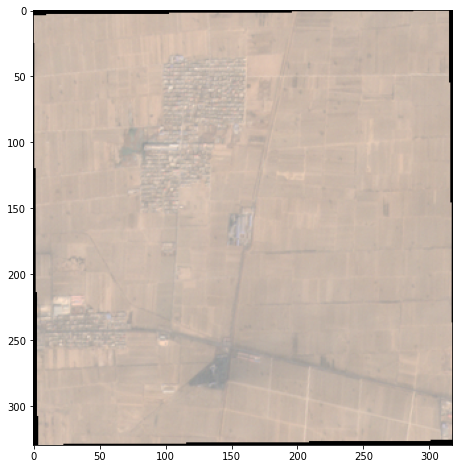

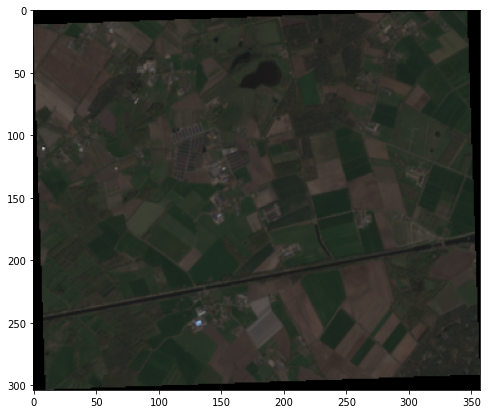

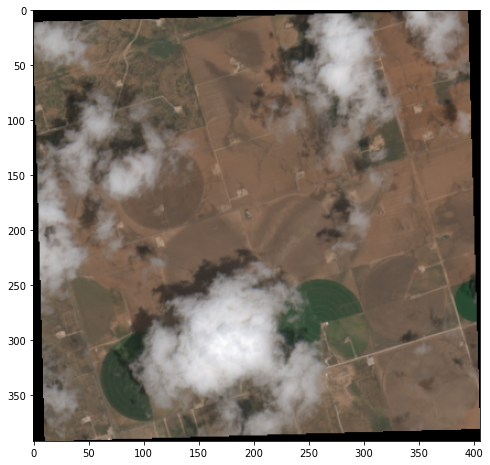

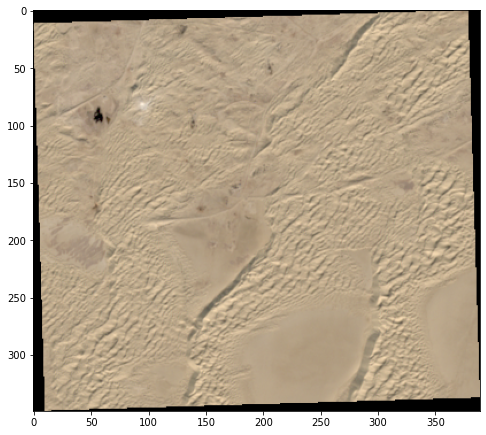

In [9]:
# plotting the above samples using the function implemented in visualization.py
# We pass below only the RGB channels in the correct order for visualization
for fname in fnames:
    fname = os.path.join(data_dir, 'Train', fname)
    visualisation.plot_satellite_image(fname, band_list=[2, 1, 0], fig_size=(8, 8))

From the above example images, we see diverse landscape with varying amount of vegetation, agriculture land as well as the forests. For the last image, we see completely barren land. For the third image from the top, we also see that the images are corrupted with the presence of cloud. Clearly, such images need preprocessing for cloud removal, however, in this study we keep this beyond the scope.

In [58]:
def disp_img_bands(filenames):
    import tifffile as tiff
    import rasterio
    num = 11
    filenames = filenames[:num]
    fig, ax = plt.subplots(nrows=4, ncols=num, figsize=(20, 8))
    for i, fname in enumerate(filenames):
        img1 = tiff.imread(fname)
        img2 = rasterio.open(fname)
        for j in range(num):
            ax[i, j].imshow(img1[:,:,j])
            if i==0:
                ax[i, j].set_title(img2.descriptions[j])
            if j==0:
                ax[i, j].set_ylabel(fname.split("/")[-1].split(".")[0])
    
    
    fig.tight_layout();

In [56]:
fnames = ['china_train1_0209.tif', 'europe_train1_0427.tif', 'permian_train1_0601.tif', 'turk_train2_1113.tif']
filenames = [os.path.join(data_dir, 'Train', fname) for fname in fnames]

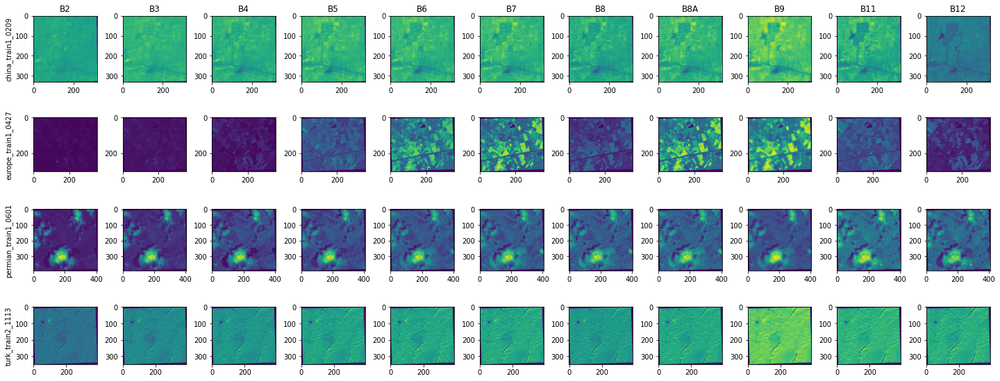

In [59]:
disp_img_bands(filenames)

### Building classification models for land cover

Since we do not have labelled data, we propose to perform unsupervied clustering of the data and seggregate different componenets of the landscape. Further, it is hoped that based on expert analysis of the clusters, each cluster can be assigned to a certain landscape category. Note that the worng choice of number of clusters can lead to incorrect number of landscapes. However, more than one cluster can be assigned to a landscape, thus it should be ok to choose the number of clusters to be higher than 5 (the number of landscapes planned).

### K-means clustering on the full train set
We first perform K-means clustering on the full train set to see how well the method fairs in terms of seggregating the important features from the image. We use all the 5 channels as reported above and choose the number of clusters as 

In [10]:
land_cover_seg = lcsegm_models.LandCoverSegmentationModel(file_path = os.path.join(data_dir, "Train"),
                                                          file_name = "*", band_list=[2, 1, 0, 6, 9], n_cluster = 7)

In [11]:
kmeams_cluster_model, x_cluster, cluster_centers = land_cover_seg.kmeans_clustering()


### Testing the performance of the model on the train set
We have trained a K-means model on the entire train set. It is now of interest to view the performance on a few training samples to understand how well the model works. Note that the samples are manually but randomly sampled.

In [12]:
train_fnames = ['china_train2_0912.tif', 'europe_train2_1109.tif', 'turk_train1_0603.tif', 'permian_train1_0303.tif']

1.0
1.0
1.0
1.0


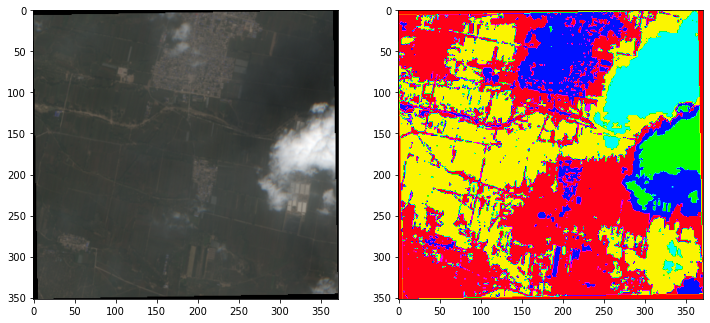

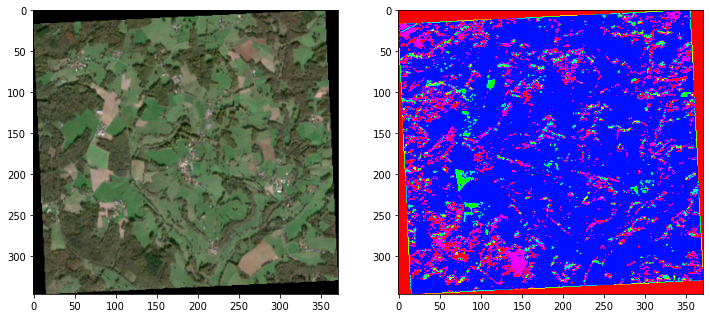

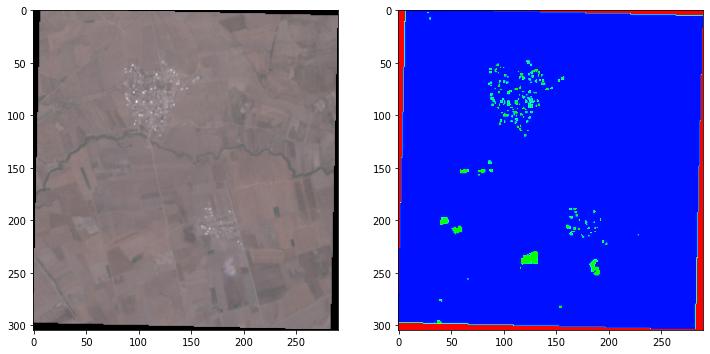

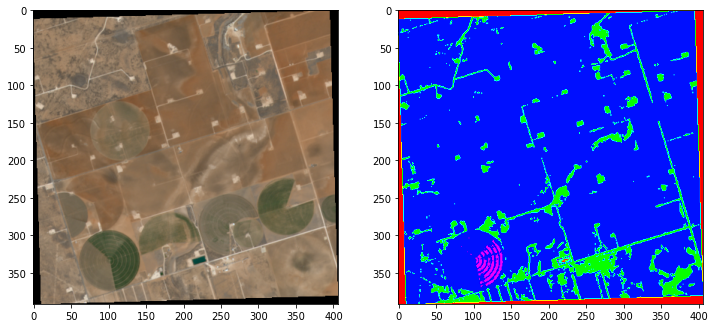

In [41]:
for fname in train_fnames:
    train_cluster = test_model.TestLandCoverSegmentationModel(model = kmeams_cluster_model,
                                                              data_path = os.path.join(data_dir, "Train"),
                                                              file_name = fname, band_list=[2, 1, 0, 6, 9])
    norm_rgb_img, train_clusters = train_cluster.test()
    
    print(np.max(norm_rgb_img))
    
    fig, ax = plt.subplots(1, 2)
    fig.set_figheight(12)
    fig.set_figwidth(12)
    im1 = ax[0].imshow(norm_rgb_img)
    im2 = ax[1].imshow(train_clusters, cmap="hsv", vmin=0, vmax=6)

In the above results, we see that  with the number of clusters set to 7, we already get clear distinction between many of the land cover features. Moreover the empty part of the image is also clearly separated in Red (might be different for a new run, but consistent across all images). Similarly, we can clearly see dense and light vegetations, barren lands as well as urban areas makred correctly in most of the parts of the sampled images. However, there are small parts which are still errorneous, as well as the clouds are not clearly seperated. For the current study, it is of interest to see if we can put cloud  as a different class to avoid any ambuigity. For this, we increase the number of classes to 8.

In [16]:
land_cover_seg8 = lcsegm_models.LandCoverSegmentationModel(file_path = os.path.join(data_dir, "Train"),
                                                           file_name = "*", band_list=[2, 1, 0, 6, 9], n_cluster = 8)

kmeams_cluster_model8, x_cluster8, cluster_centers8 = land_cover_seg8.kmeans_clustering()

1.0
1.0
1.0
1.0


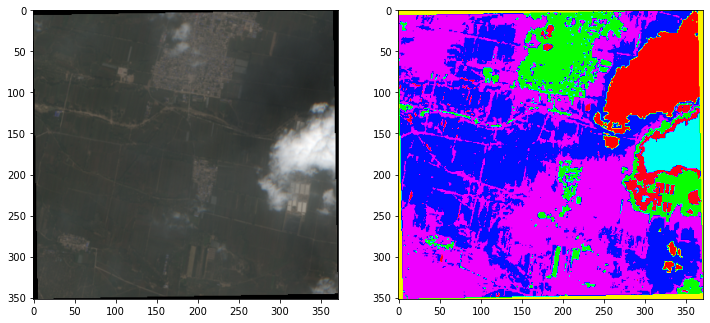

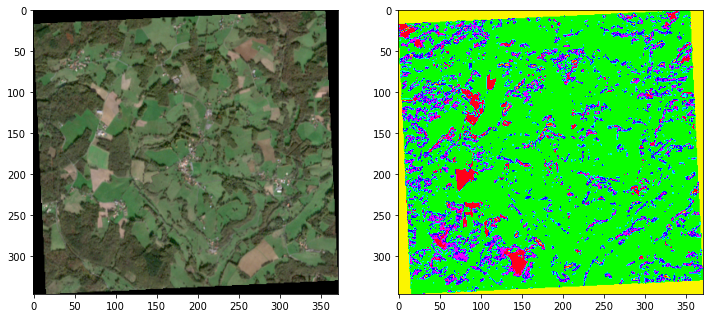

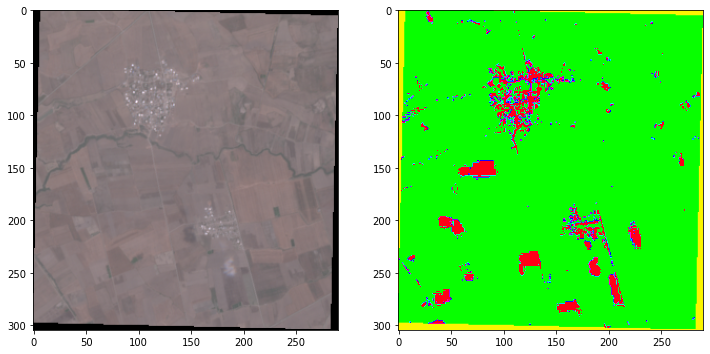

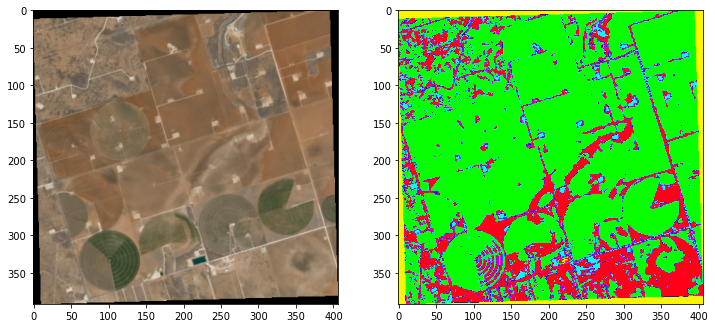

In [17]:
for fname in train_fnames:
    train_cluster8 = test_model.TestLandCoverSegmentationModel(model = kmeams_cluster_model8,
                                                              data_path = os.path.join(data_dir, "Train"),
                                                              file_name = fname, band_list=[2, 1, 0, 6, 9])
    norm_rgb_img, train_clusters = train_cluster8.test()
    
    print(np.max(norm_rgb_img))
    
    fig, ax = plt.subplots(1, 2)
    fig.set_figheight(12)
    fig.set_figwidth(12)
    img1 = ax[0].imshow(norm_rgb_img)
    img2 = ax[1].imshow(train_clusters, cmap="hsv", vmin=0, vmax=6)

Clearly, increasing the number of clusters from 7 to 8 does not really help in improving on the first image and we stick to the model with 7 for our test data analysis.

### Testing the performance of the model on the test set
To evaulate the generalization of the model trained above, we qualitatively test the performance on the test set. Similar to the train set, we draw 4 diverse samples randomly from the test set, one for each region. Further, we also build two sets for region specific data, each containing 4 samples from one region, namely China and Europe.

In [18]:
test_fnames = ['china_test_0912.tif', 'europe_test_0427.tif', 'permian_test3_0303.tif', 'turk_test_0404.tif']
test_fnames_china = ['china_test_0912.tif', 'china_test_0120.tif', 'china_test_0311.tif', 'china_test_0714.tif']
test_fnames_europe = ['europe_test_0601.tif', 'europe_test_0427.tif', 'europe_test_0721.tif', 'europe_test_1004.tif']

1.0


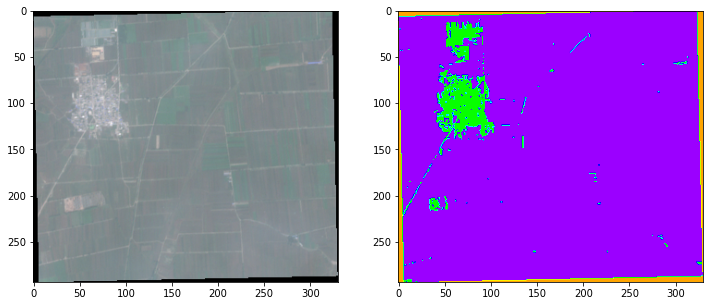

1.0


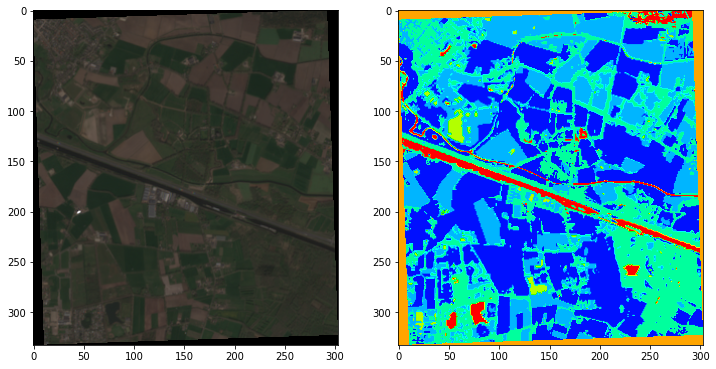

1.0


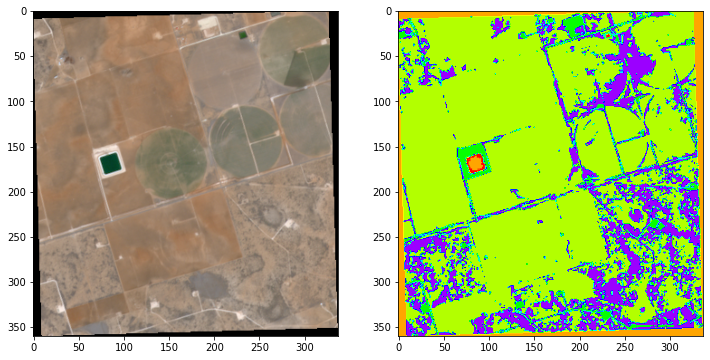

1.0


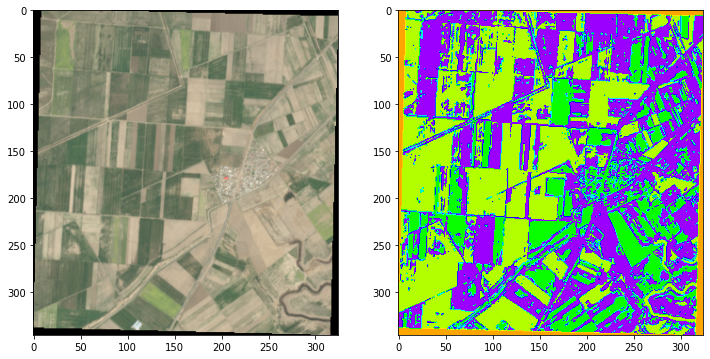

In [19]:
# Running the trained model on 4 samples from the test set from 4 different regions
for fname in test_fnames:
    test_cluster = test_model.TestLandCoverSegmentationModel(model = kmeams_cluster_model8,
                                                             data_path = os.path.join(data_dir, 'Test'),
                                                             file_name = fname, band_list=[2, 1, 0, 6, 9])
    rgb_img, test_clusters = test_cluster.test()
    
    print(np.max(rgb_img))
    fig, ax = plt.subplots(1, 2)
    fig.set_figheight(12)
    fig.set_figwidth(12)
    im1 = ax[0].imshow(rgb_img)
    im2 = ax[1].imshow(test_clusters, cmap="hsv", vmin=0, vmax=9)
    plt.show()
    

Above, we see the results for 4 different samples, each from a different region. In general, we see that the k-means when collectively applied on a diverse set of samples, is able to segment the image into different landscape features. These can then be interpreted by experts to be classified into different parts. Next, we also look at two different regions to understand better how the model fairs in region specific cases. Note that these two regions are chosen randomly out of the 4 regions.

1.0


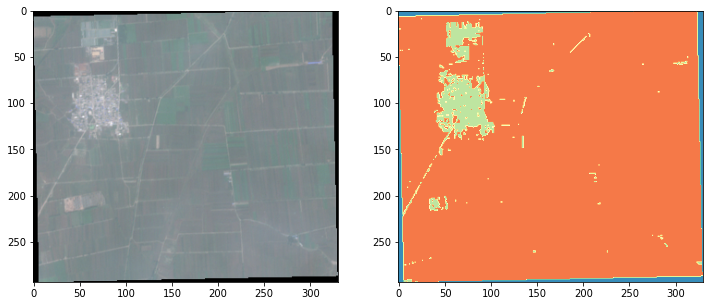

1.0


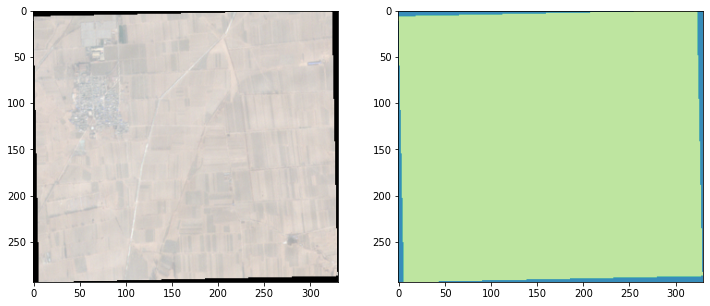

1.0


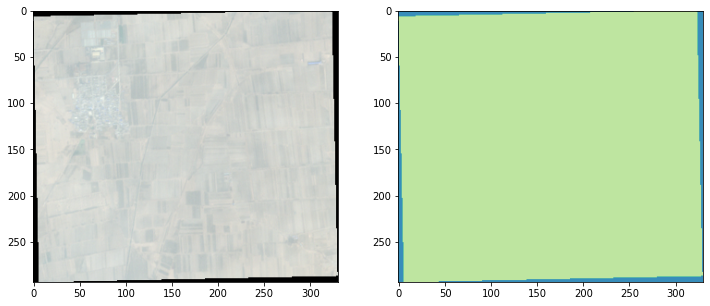

1.0


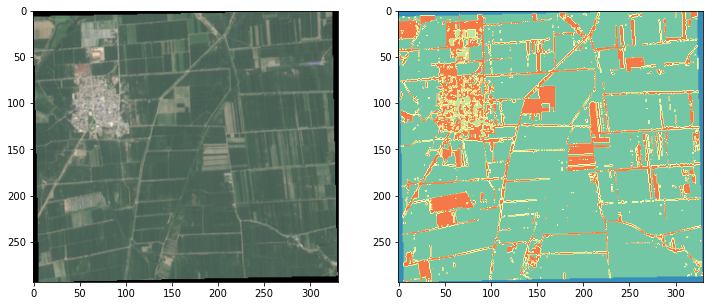

In [42]:
# Running the trained model on 4 samples from the test set from 4 different regions
for fname in test_fnames_china:
    test_cluster = test_model.TestLandCoverSegmentationModel(model = kmeams_cluster_model8,
                                                             data_path = os.path.join(data_dir, 'Test'),
                                                             file_name = fname, band_list=[2, 1, 0, 6, 9])
    rgb_img, test_clusters = test_cluster.test()
    
    print(np.max(rgb_img))
    fig, ax = plt.subplots(1, 2)
    fig.set_figheight(12)
    fig.set_figwidth(12)
    im1 = ax[0].imshow(rgb_img)
    im2 = ax[1].imshow(test_clusters, cmap="Spectral_r", vmin=0, vmax=9)
    plt.show()
    

From the outputs obtained for China, we see that the performs decently already on the test samples from China. However, a closer look reveals that there are some artefacts in the predictions. For example, for the top image, there are dense vegetation parts detected, although it is not visible to us. It is hoped that such artefacts can be removed with the improved model presented later in this report. For now, we investigate how the model works on data feom Europe.

1.0


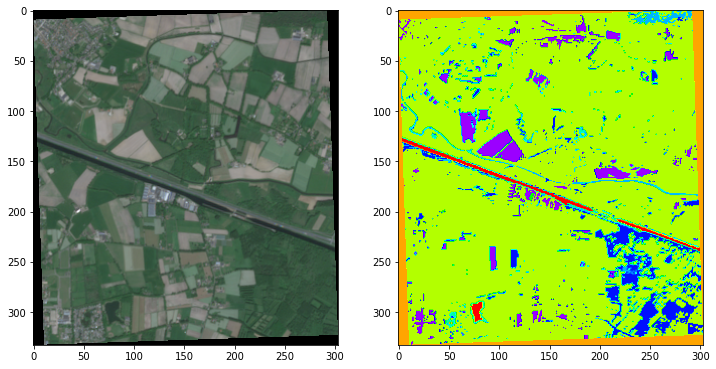

1.0


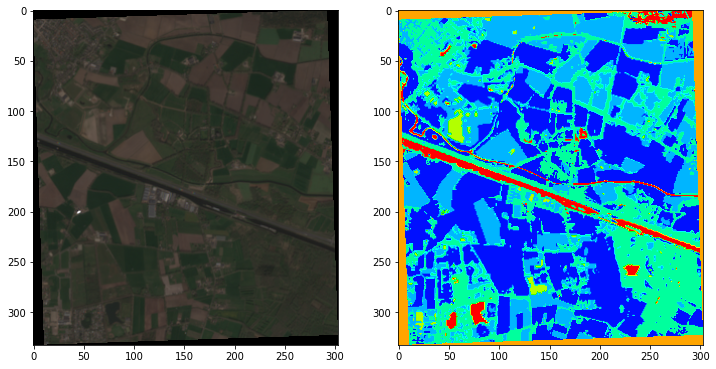

1.0


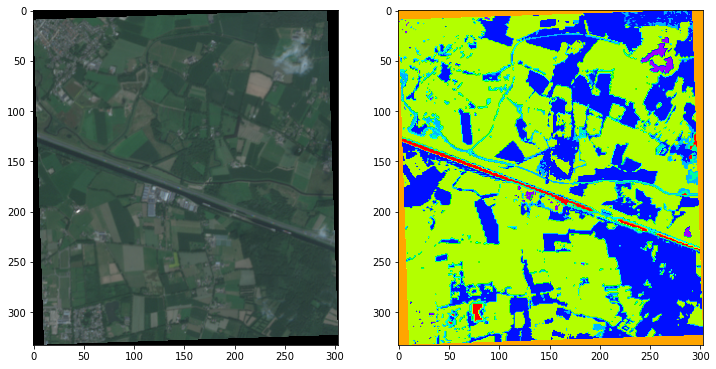

1.0


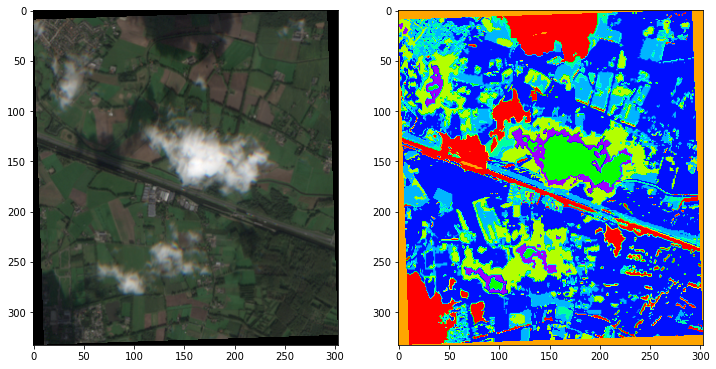

In [21]:
# Running the trained model on 4 samples from the test set from 4 different regions
for fname in test_fnames_europe:
    test_cluster = test_model.TestLandCoverSegmentationModel(model = kmeams_cluster_model8,
                                                             data_path = os.path.join(data_dir, 'Test'),
                                                             file_name = fname, band_list=[2, 1, 0, 6, 9])
    rgb_img, test_clusters = test_cluster.test()
    
    print(np.max(rgb_img))
    fig, ax = plt.subplots(1, 2)
    fig.set_figheight(12)
    fig.set_figwidth(12)
    im1 = ax[0].imshow(rgb_img)
    im2 = ax[1].imshow(test_clusters, cmap="hsv", vmin=0, vmax=9)
    plt.show()
    

We now see above the application of th generic model on the data samples from Europe. For all cases, the model again performs well, however, there is still scope of improvement. For example, for the first image, the barren land is segemnted in two colors. Similarly, the road/water body in all the 4 images does not seem to have been clearly demarcated. 

We experiment below if we can improve the above mentioned issues through training one model for each region.

#### Running region specific models for improved classification

We experiment below if region-specific clustering models can improve the quality of segmentation. The motivation is that images from all the 4 regions are very different in terms of the composition of different landscapes, and fitting a simple model such as K-means might be hard. In this regard, we rain rgion specific models. We experiment it for China dn Euope data and present the results below.

In [29]:
kmeans_europe = lcsegm_models.LandCoverSegmentationModel(file_path = os.path.join(data_dir, "Train"),
                                                         file_name = "europe*", band_list=[2, 1, 0, 6, 9], n_cluster=7)

cluster_model_europe, x_cluster_europe, cluster_centers_europe = kmeans_europe.kmeans_clustering()

1.0


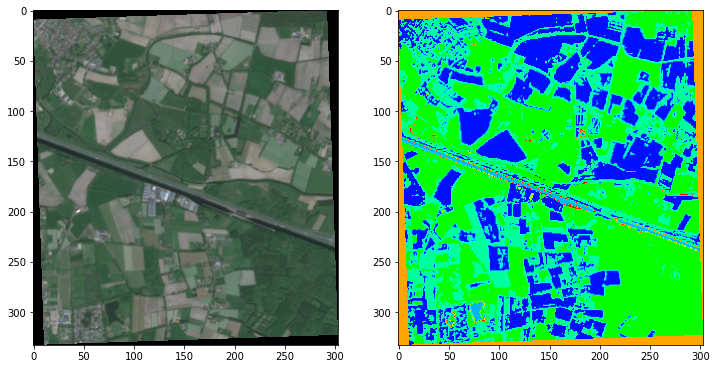

1.0


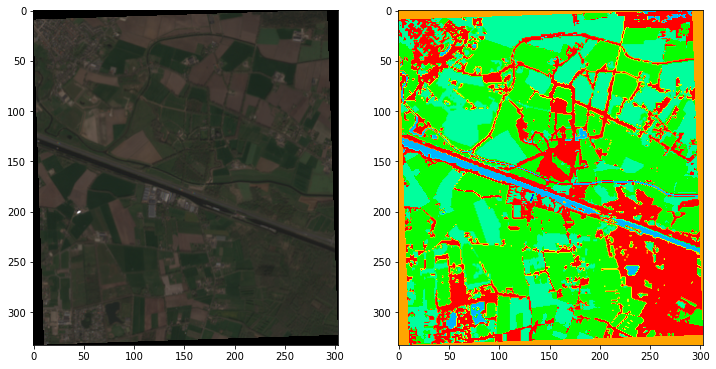

1.0


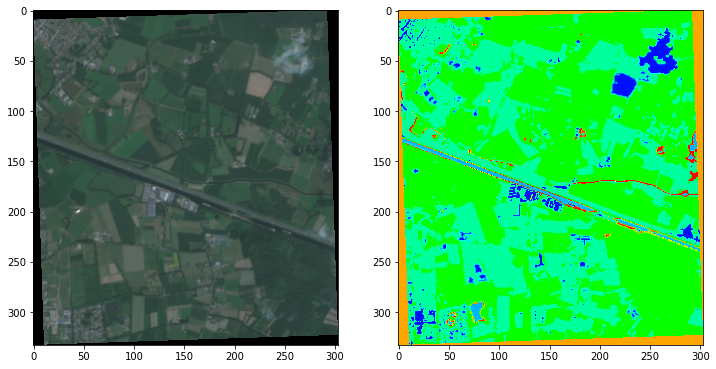

1.0


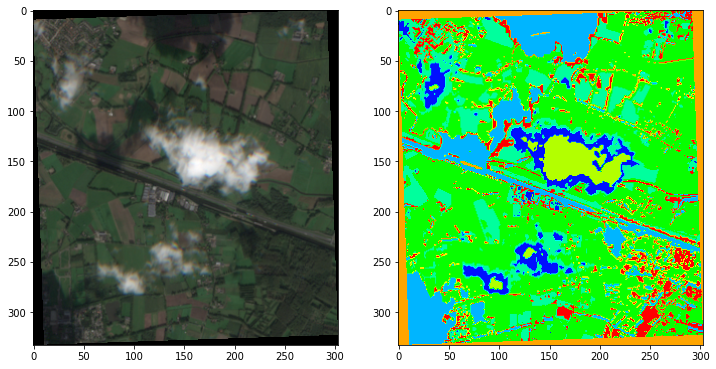

In [30]:
# Running the trained model on 4 samples from the test set from Europe
for fname in test_fnames_europe:
    test_cluster = test_model.TestLandCoverSegmentationModel(model = cluster_model_europe,
                                                             data_path = os.path.join(data_dir, 'Test'),
                                                             file_name = fname, band_list=[2, 1, 0, 6, 9])
    rgb_img, test_clusters = test_cluster.test()
    
    print(np.max(rgb_img))
    fig, ax = plt.subplots(1, 2)
    fig.set_figheight(12)
    fig.set_figwidth(12)
    im1 = ax[0].imshow(rgb_img)
    im2 = ax[1].imshow(test_clusters, cmap="hsv", vmin=0, vmax=9)
    plt.show()
    

In [31]:
kmeans_china = lcsegm_models.LandCoverSegmentationModel(file_path = os.path.join(data_dir, "Train"),
                                                           file_name = "china*", band_list=[2, 1, 0, 6, 9], n_cluster=7)

cluster_model_china, x_cluster_china, cluster_centers_china = kmeans_china.kmeans_clustering()

1.0


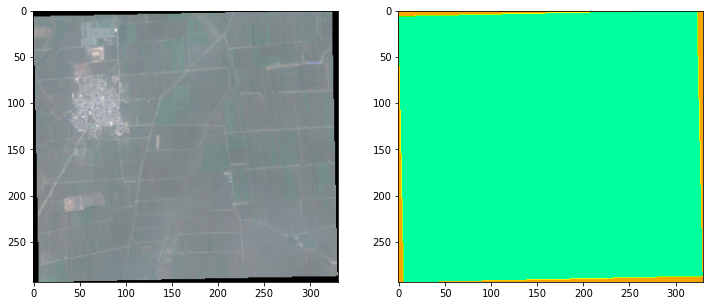

1.0


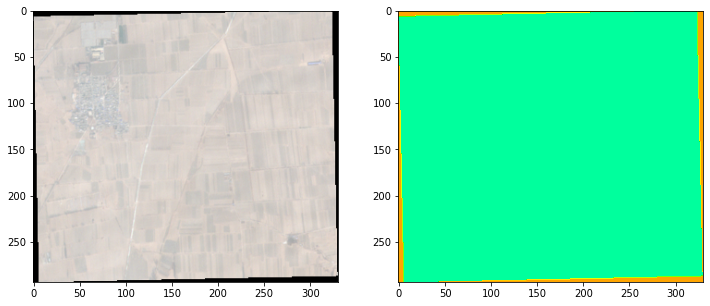

1.0


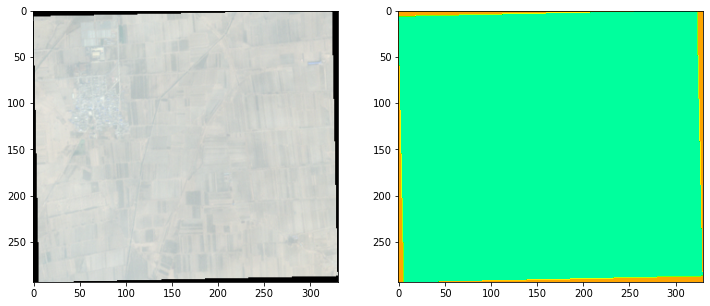

1.0


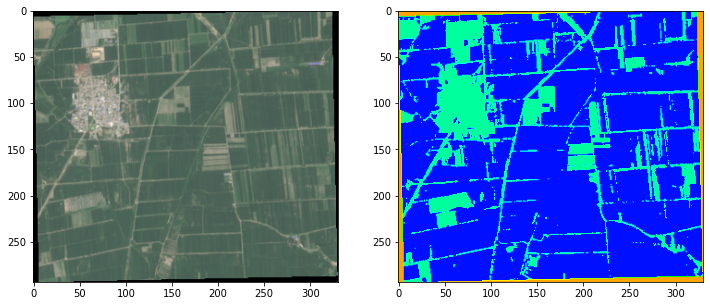

In [32]:
# Running the trained model on 4 samples from the test set from China
for fname in test_fnames_china:
    test_cluster = test_model.TestLandCoverSegmentationModel(model = cluster_model_china,
                                                             data_path = os.path.join(data_dir, 'Test'),
                                                             file_name = fname, band_list=[2, 1, 0, 6, 9])
    rgb_img, test_clusters = test_cluster.test()
    
    print(np.max(rgb_img))
    fig, ax = plt.subplots(1, 2)
    fig.set_figheight(12)
    fig.set_figwidth(12)
    im1 = ax[0].imshow(rgb_img)
    im2 = ax[1].imshow(test_clusters, cmap="hsv", vmin=0, vmax=9)
    plt.show()
    

In [ ]:
kmeans_china = lcsegm_models.LandCoverSegmentationModel(file_path = os.path.join(data_dir, "Train"),
                                                           file_name = "china*", band_list=[2, 1, 0, 6, 9], n_cluster=7)

cluster_model_china, x_cluster_china, cluster_centers_china = kmeans_china.kmeans_clustering()

In [ ]:
# Running the trained model on 4 samples from the test set from China
for fname in test_fnames_china:
    test_cluster = test_model.TestLandCoverSegmentationModel(model = cluster_model_china,
                                                             data_path = os.path.join(data_dir, 'Test'),
                                                             file_name = fname, band_list=[2, 1, 0, 6, 9])
    rgb_img, test_clusters = test_cluster.test()
    
    print(np.max(rgb_img))
    fig, ax = plt.subplots(1, 2)
    fig.set_figheight(12)
    fig.set_figwidth(12)
    im1 = ax[0].imshow(rgb_img)
    im2 = ax[1].imshow(test_clusters, cmap="hsv", vmin=0, vmax=9)
    plt.show()
    

In [22]:
k_means_china = main.KmeansClustering(file_path = os.path.join(data_dir, 'Train'), file_name="china*", band_list=[2,1,0,6,9], n_cluster= 7)

NameError: name 'main' is not defined

In [49]:
cluster_model_china, X_cluster_china, cluster_centers_china, min_arr_china, max_arr_china = k_means_china.train_cluster()

In [50]:
test_fnames_china = ['china_test_0912.tif', 'china_test_0120.tif', 'china_test_0311.tif', 'china_test_0714.tif']

0.48426986811868816


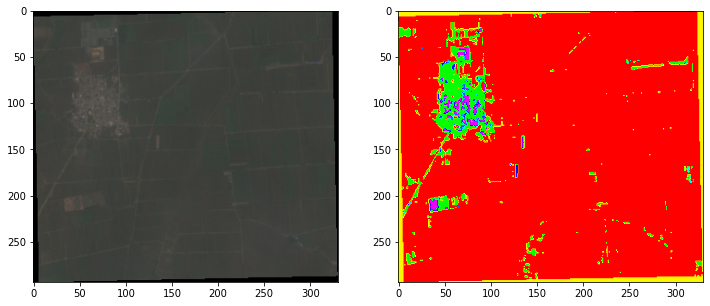

0.45601957393864057


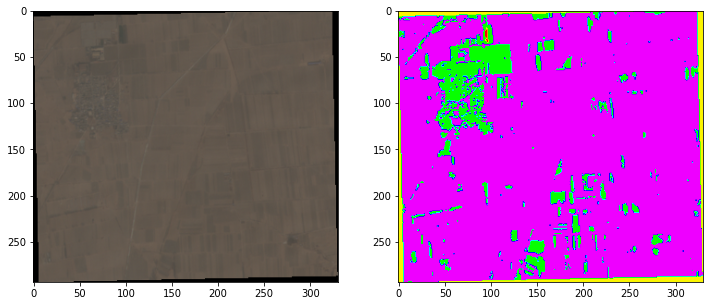

0.4606560624543267


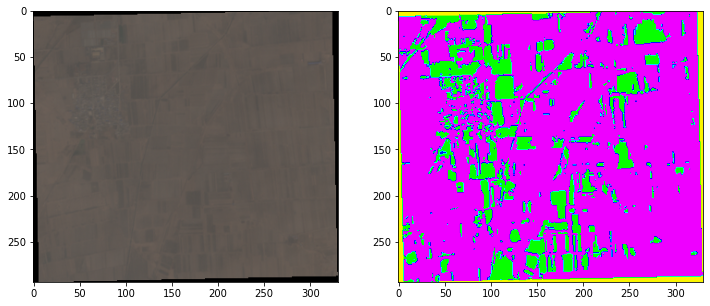

0.5021205898426294


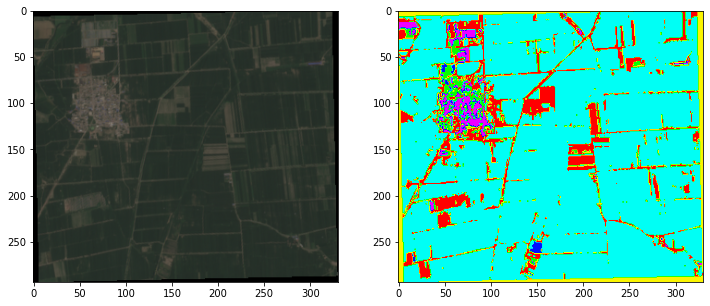

In [51]:
for fname in test_fnames_china:
    test_cluster = test_model.TestModel(model = cluster_model_china, data_path = os.path.join(data_dir, 'Test'), file_name=fname, band_list=[2,1,0,6,9], min_arr=min_arr_china, max_arr=max_arr_china)
    rgb_img, test_clusters = test_cluster.test()
    
    print(np.max(rgb_img))
    fig, ax = plt.subplots(1, 2)
    fig.set_figheight(12)
    fig.set_figwidth(12)
    im1 = ax[0].imshow(rgb_img)
    im2 = ax[1].imshow(test_clusters, cmap="hsv", vmin=0, vmax=6)
    plt.show()

0.48426986811868816


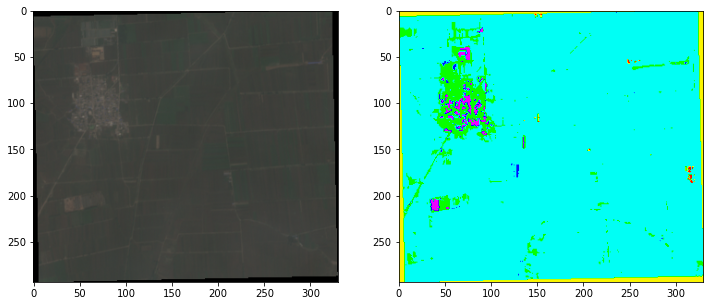

0.45601957393864057


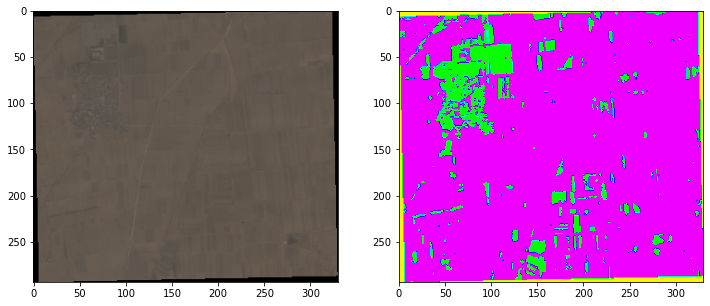

0.4606560624543267


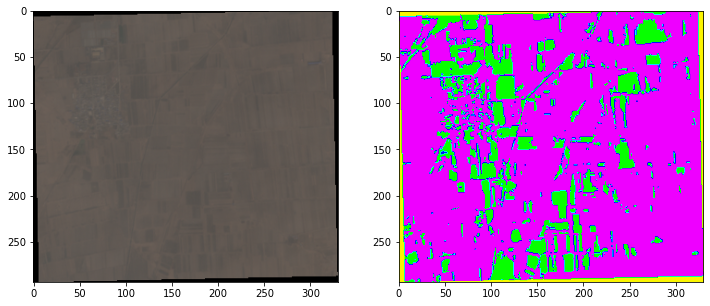

0.5021205898426294


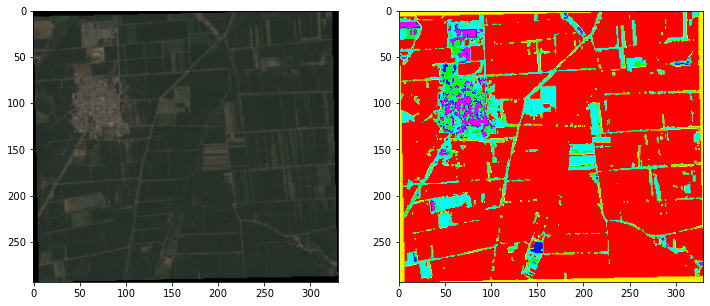

In [20]:
for fname in test_fnames_china:
    test_cluster = test_model.TestModel(model = cluster_model_china, data_path = os.path.join(data_dir, 'Test'), file_name=fname, band_list=[2,1,0,6,9], min_arr=min_arr_china, max_arr=max_arr_china)
    rgb_img, test_clusters = test_cluster.test()
    
    print(np.max(rgb_img))
    fig, ax = plt.subplots(1, 2)
    fig.set_figheight(12)
    fig.set_figwidth(12)
    im1 = ax[0].imshow(rgb_img)
    im2 = ax[1].imshow(test_clusters, cmap="hsv", vmin=0, vmax=6)
    plt.show()

In [52]:
k_means_europe = main.KmeansClustering(file_path = os.path.join(data_dir, 'Train'), file_name="europe*", band_list=[2,1,0,6,9], n_cluster= 7)

In [53]:
cluster_model_europe, X_cluster_europe, cluster_centers_europe, min_arr_europe, max_arr_europe = k_means_europe.train_cluster()

In [54]:
test_fnames_europe = ['europe_test_0601.tif', 'europe_test_0427.tif', 'europe_test_0721.tif', 'europe_test_1004.tif']

0.6362130295348299


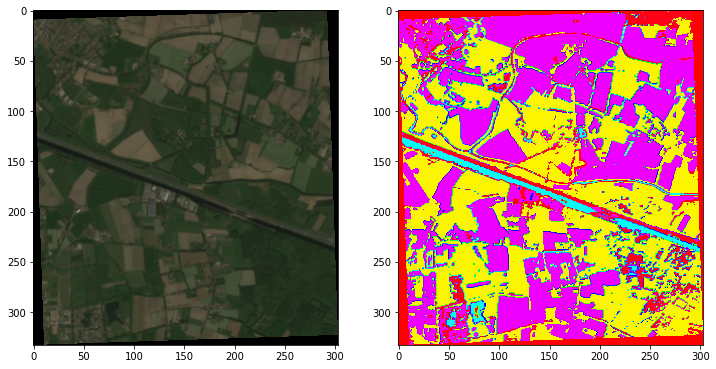

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0836742333624236


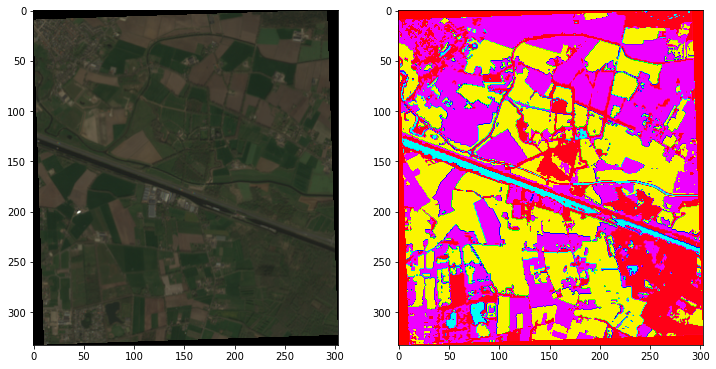

0.7899316764254569


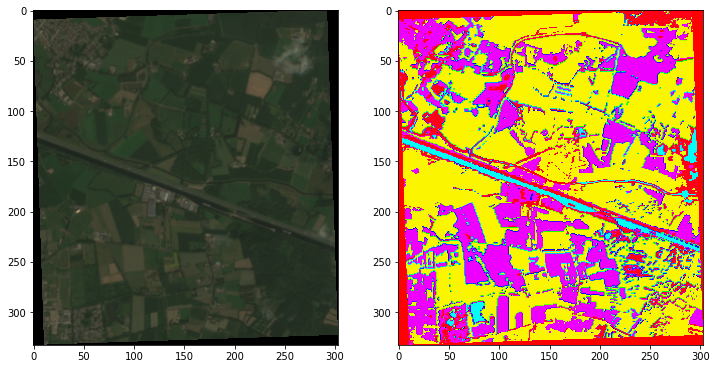

0.809590829870409


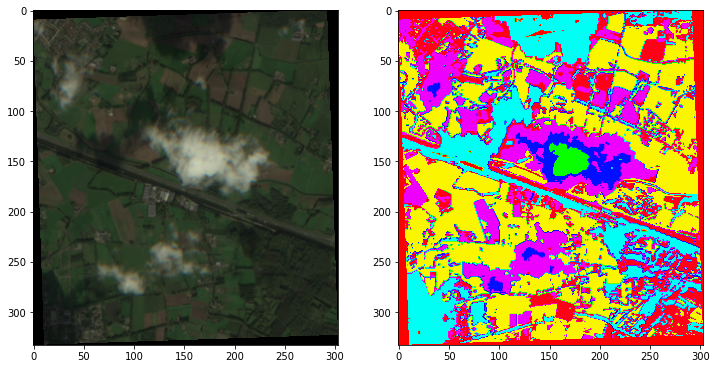

In [55]:
for fname in test_fnames_europe:
    test_cluster = test_model.TestModel(model = cluster_model_europe, data_path = os.path.join(data_dir, 'Test'), file_name=fname, band_list=[2,1,0,6,9], min_arr=min_arr_europe, max_arr=max_arr_europe)
    rgb_img, test_clusters = test_cluster.test()
    
    print(np.max(rgb_img))
    fig, ax = plt.subplots(1, 2)
    fig.set_figheight(12)
    fig.set_figwidth(12)
    im1 = ax[0].imshow(rgb_img)
    im2 = ax[1].imshow(test_clusters, cmap="hsv", vmin=0, vmax=6)
    plt.show()

0.6362130295348299


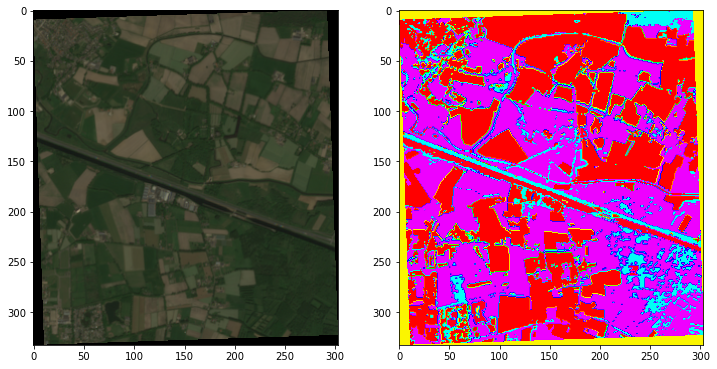

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0836742333624236


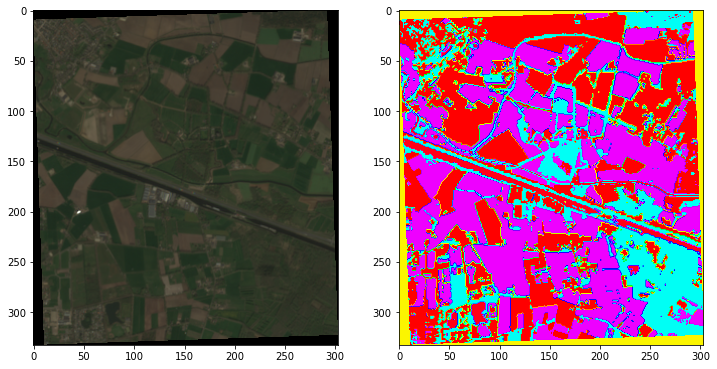

0.7899316764254569


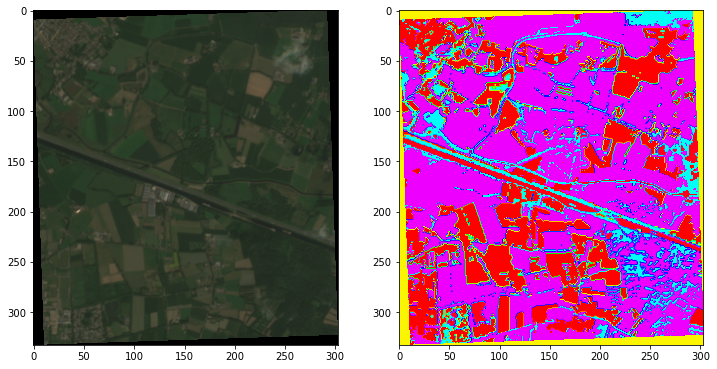

0.809590829870409


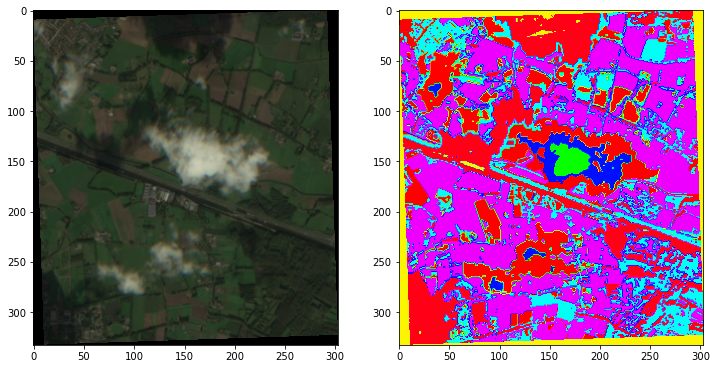

In [24]:
for fname in test_fnames_europe:
    test_cluster = test_model.TestModel(model = cluster_model_europe, data_path = os.path.join(data_dir, 'Test'), file_name=fname, band_list=[2,1,0,6,9], min_arr=min_arr_europe, max_arr=max_arr_europe)
    rgb_img, test_clusters = test_cluster.test()
    
    print(np.max(rgb_img))
    fig, ax = plt.subplots(1, 2)
    fig.set_figheight(12)
    fig.set_figwidth(12)
    im1 = ax[0].imshow(rgb_img)
    im2 = ax[1].imshow(test_clusters, cmap="hsv", vmin=0, vmax=6)
    plt.show()

We see from the results above that visually, the region-specific models improve the quality of segmentation for both the regions. However, it is hard to make clear interpretations due to lack of sufficient knowledge on interpreting these images.

#### Overall observations


1. The goal is to conduct classification of land covers for the provided satellite images. However, since there is no labelled data, we can take the approach for performing clustering and assigning meaning to each cluster based on domain expertise. In this report, we experimented the application of K-means for the purpose of clustering, and it was found to work well.
2. To further improve the model, it is proposed to develop region-specific models, and these models seem to qualitatively work better than the original single model.
3. The presented analysis is mostly qualitative due to lack of sufficient knowledge of the domain, however, visually, it is clear that the segmentations are decently good.


#### Future work
We have only used K-means and this method treats each point independently in the X-Y space, and only performs clustering in the 5D band space. With more data, it is also possible develop unsupervised segementation method that also take into account the semantic context. For example, there might be two landcovers that cannot occur side-by-side and the model can learn this by taking the semantic context. This could significantly improve the segementation and classification of the landcovers.